---
title: Standard Analyses
author: Benjamin Doran
date: Dec 2023
---

In [200]:
#| code-summary: Julia library setup
#| code-fold: true
using DrWatson
@quickactivate projectdir()

using CSV, DataFrames, Muon
using Random: seed!
using UMAP, Distances

using LinearAlgebra, StatsBase

using StatsPlots
theme(:default, grid=false, tickdir=:out, label=false)
include(srcdir("helpers.jl"))

bbdir = datadir("exp_raw", "BB669");
tdir_16S = projectdir("_research", "BB669_16S_phyml")
tdir_bac120 = projectdir("_research", "BB669_bac120_phyml")
pdir_16S = plotsdir("BB669_16Strees") |> mkpath
pdir_bac120 = plotsdir("BB669_bac120trees") |> mkpath;


In [2]:
#| code-summary: R library setup
#| code-fold: true
#| output: false
using RCall
R"""
library(ape)
library(treeio)
library(ggtree)
library(ggplot2)
library(tidyverse)

setwd($(projectdir()))
""";

┌ Warning: RCall.jl: Registered S3 methods overwritten by 'treeio':
│   method              from    
│   MRCA.phylo          tidytree
│   MRCA.treedata       tidytree
│   Nnode.treedata      tidytree
│   Ntip.treedata       tidytree
│   ancestor.phylo      tidytree
│   ancestor.treedata   tidytree
│   child.phylo         tidytree
│   child.treedata      tidytree
│   full_join.phylo     tidytree
│   full_join.treedata  tidytree
│   groupClade.phylo    tidytree
│   groupClade.treedata tidytree
│   groupOTU.phylo      tidytree
│   groupOTU.treedata   tidytree
│   inner_join.phylo    tidytree
│   inner_join.treedata tidytree
│   is.rooted.treedata  tidytree
│   nodeid.phylo        tidytree
│   nodeid.treedata     tidytree
│   nodelab.phylo       tidytree
│   nodelab.treedata    tidytree
│   offspring.phylo     tidytree
│   offspring.treedata  tidytree
│   parent.phylo        tidytree
│   parent.treedata     tidytree
│   root.treedata       tidytree
│   rootnode.phylo      tidytree
│   sibl

┌ Warning: RCall.jl: -- Attaching core tidyverse packages ------------------------ tidyverse 2.0.0 --
│ v dplyr     1.1.3     v readr     2.1.4
│ v forcats   1.0.0     v stringr   1.5.0
│ v lubridate 1.9.3     v tibble    3.2.1
│ v purrr     1.0.2     v tidyr     1.3.0
│ -- Conflicts ------------------------------------------ tidyverse_conflicts() --
│ x tidyr::expand() masks ggtree::expand()
│ x dplyr::filter() masks stats::filter()
│ x dplyr::lag()    masks stats::lag()
│ x dplyr::where()  masks ape::where()
│ i Use the conflicted package (<http://conflicted.r-lib.org/>) to force all conflicts to become errors
└ @ RCall /Users/bend/.julia/packages/RCall/gOwEW/src/io.jl:172


## Standard analysis

In [8]:
biobank = readh5mu(joinpath(bbdir, "BB669.h5mu"))
biobank.obs[!,:kept_species] = convert.(Bool,biobank.obs[!,:kept_species]);
biobank

┌ Warning: Cannot join columns with the same name because var_names are intersecting.
└ @ Muon /Users/bend/.julia/packages/Muon/eLqpV/src/mudata.jl:351


MuData object 669 ✕ 21475
└ metabolites_foldchange
  AnnData object 669 ✕ 50
└ UPorder_oggs
  AnnData object 669 ✕ 10177
└ oggs
  AnnData object 669 ✕ 11248

In [9]:
bbobs = biobank.obs;
first(bbobs, 5)

Row,Strain_ID,Accession,Phylum,Class,Order,Family,Genus,Species,Donor,NCBI_Phylum,NCBI_Class,NCBI_Order,NCBI_Family,NCBI_Genus,NCBI_Species,GTDB_Phylum,GTDB_Class,GTDB_Order,GTDB_Family,GTDB_Genus,GTDB_Species,kept_species
,String,String,String,String,String,String,String,String,String,String,String,String,String,String,String,String,String,String,String,String,String,Bool
1,MSK.16.19,JAHOLG000000000,Bacteroidetes,Bacteroidia,Bacteroidales,Bacteroidaceae,Bacteroides,Bacteroides eggerthii,MSK.16,Bacteroidetes,Bacteroidia,Bacteroidales,Bacteroidaceae,Bacteroides,Bacteroides eggerthii,Bacteroidota,Bacteroidia,Bacteroidales,Bacteroidaceae,Bacteroides,Bacteroides eggerthii,false
2,MSK.10.5,JAHOMY000000000,Bacteroidetes,Bacteroidia,Bacteroidales,Bacteroidaceae,Bacteroides,Bacteroides fragilis,MSK.10,Bacteroidetes,Bacteroidia,Bacteroidales,Bacteroidaceae,Bacteroides,Bacteroides fragilis,Bacteroidota,Bacteroidia,Bacteroidales,Bacteroidaceae,Bacteroides,Bacteroides fragilis_A,false
3,MSK.13.23,JAHOMK000000000,Bacteroidetes,Bacteroidia,Bacteroidales,Bacteroidaceae,Bacteroides,Bacteroides fragilis,MSK.13,Bacteroidetes,Bacteroidia,Bacteroidales,Bacteroidaceae,Bacteroides,Bacteroides fragilis,Bacteroidota,Bacteroidia,Bacteroidales,Bacteroidaceae,Bacteroides,Bacteroides fragilis_A,false
4,MSK.16.61,JAHOKD000000000,Bacteroidetes,Bacteroidia,Bacteroidales,Bacteroidaceae,Phocaeicola,Phocaeicola vulgatus,MSK.16,Bacteroidetes,Bacteroidia,Bacteroidales,Bacteroidaceae,Phocaeicola,Phocaeicola vulgatus,Bacteroidota,Bacteroidia,Bacteroidales,Bacteroidaceae,Phocaeicola,Phocaeicola vulgatus,true
5,MSK.18.56,JAHOHX000000000,Bacteroidetes,Bacteroidia,Bacteroidales,Bacteroidaceae,Bacteroides,Bacteroides caccae,MSK.18,Bacteroidetes,Bacteroidia,Bacteroidales,Bacteroidaceae,Bacteroides,Bacteroides caccae,Bacteroidota,Bacteroidia,Bacteroidales,Bacteroidaceae,Bacteroides,Bacteroides caccae,false


In [10]:
family_counts = sort(countmap(bbobs.NCBI_Family), byvalue=true, rev=true)

OrderedCollections.OrderedDict{String, Int64} with 12 entries:
  "Lachnospiraceae"              => 347
  "Bacteroidaceae"               => 229
  "Bifidobacteriaceae"           => 30
  "Tannerellaceae"               => 21
  "Prevotellaceae"               => 14
  "Rikenellaceae"                => 9
  "Erysipelotrichaceae"          => 5
  "<unclassified>"               => 4
  "Oscillospiraceae"             => 4
  "Odoribacteraceae"             => 4
  "Enterobacteriaceae"           => 1
  "Eubacteriales incertae sedis" => 1

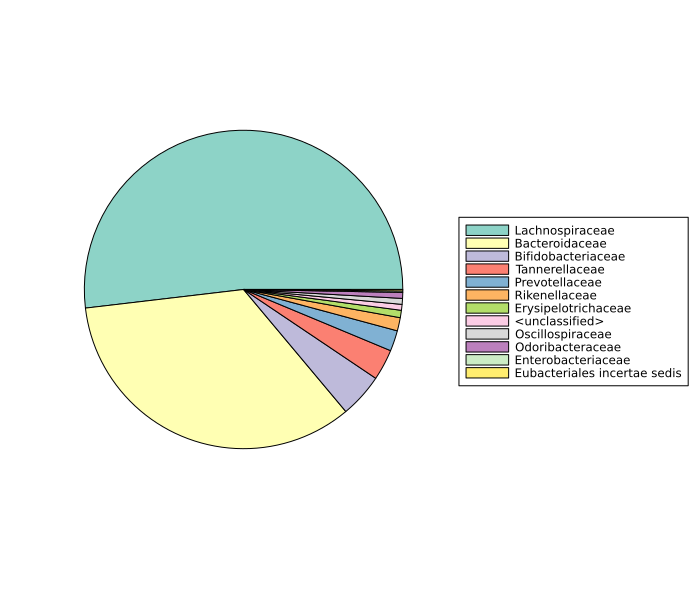

In [11]:
#| fig-cap: proportion CSB strains from different NCBI families
pie(family_counts, 
    c=palette(:Set3_12),
    legend=:outerright,
    size=(700,600),
)

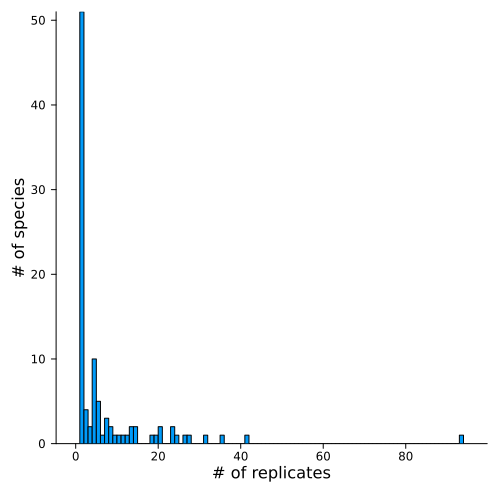

In [20]:
#| fig-cap: each bar represents the number of measured species (y axis) with a certain number of replicates (x axis).
species_counts = collect(values(countmap(bbobs.NCBI_Species)));
histogram(
    species_counts, 
    bins=100,
    xlabel="# of replicates",
    ylabel="# of species",
    size=(500,500),
)

## Phyml on 16S alignment of Biobank strains

In [12]:
# run(`sbatch $(projectdir("scripts", "run_phyml_csb16S.jl"))`);

Triggers run of `scripts/run_phyml_csb16S.jl` script on SLURM compute cluster. Has the effect of running

```
phyml \
    -dnt -mHKY85 -fe -o tlr \
    --search SPR --r_seed 123456 --rand_start --n_rand_starts 3 \
    --no_memory_check \
    --bootstrap -4 \
    -i $PROJECTDIR/data/exp_raw/BB669/BB669_16S.phy
```

outputting the results in `_research/BB669_16S_phyml` 

### plot PhyML tree of 16S alignment

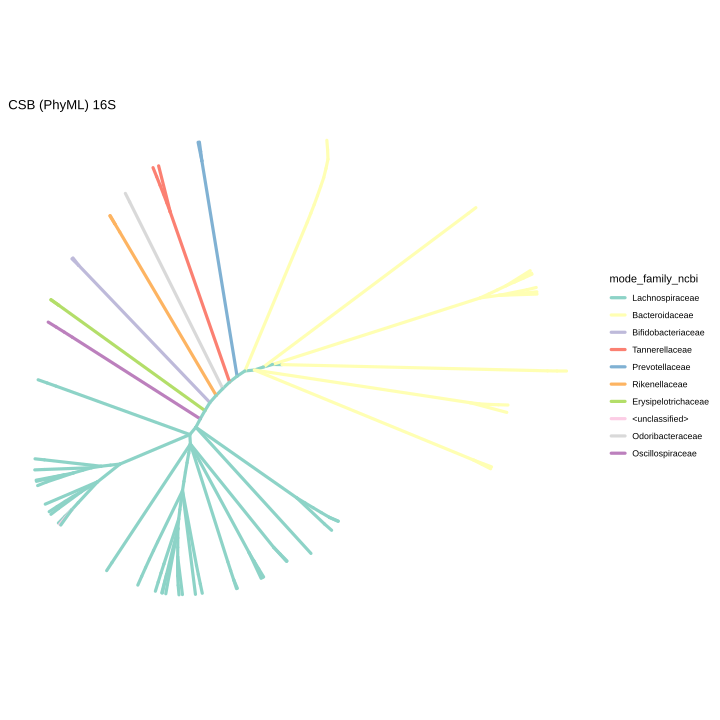

In [13]:
R"""
## read in tree and metadata
tree = read.newick(file.path($tdir_16S, "BB669_16S.phy-supporttree_multi.txt"), node.label='support')
lineagedf = read.csv(file.path($bbdir, "BB669_rowmeta.tsv"), sep="\t")
lineagedf$label = lineagedf$Strain.ID
subset_lineagedf = lineagedf[match(tree@phylo$tip.label, lineagedf$label),]
biggerfamily_ncbi = sort(table(subset_lineagedf$NCBI.Family), decreasing = TRUE)[sort(table(subset_lineagedf$NCBI.Family), decreasing = TRUE) > 0]
# labels(biggerfamily_ncbi)[[1]]
tree_withdata = as.treedata(left_join(as_tibble(tree), subset_lineagedf, by='label'))
btree_tbl = as_tibble(tree_withdata)

## Calcuate most common family desendent from each internal node of the tree
mode_family_ncbi = offspring(btree_tbl, btree_tbl$node, tiponly = FALSE, self_include = TRUE)
mode_family_ncbi = unlist(lapply(mode_family_ncbi, function(x) modeest::mfv1(x$NCBI.Family, na_rm=TRUE)))
btree_tbl$mode_family_ncbi = mode_family_ncbi
tree_withdata = as.treedata(btree_tbl)

## plot tree colored with most common family at each node
options(repr.plot.width=15, repr.plot.height=15, ignore.negative.edge=TRUE)
colorvalues = RColorBrewer::brewer.pal(12, name="Set3")
p = ggtree(tree_withdata, 
        aes(color=mode_family_ncbi, subset=support > .5), 
        layout="equal_angle", open.angle=5,
        branch.length="none", size=1.5,
    ) +
    ggtitle("CSB (PhyML) 16S") + 
    scale_color_manual(values=colorvalues, breaks=labels(biggerfamily_ncbi)[[1]]) #+theme(legend.position="none")
ggsave(file.path($pdir_16S, "CSB669_PhyML_unrooted.svg"), 
    p,
    height=10,
    width=10,
)
"""
show_svg(joinpath(pdir_16S, "CSB669_PhyML_unrooted.svg"))

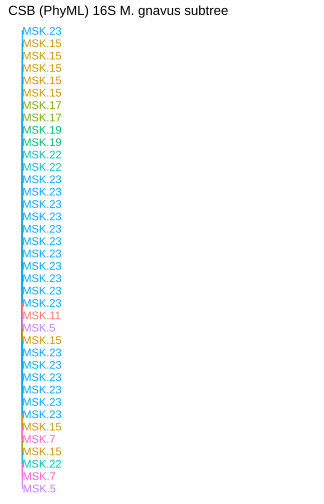

In [14]:
R"""
# plot M. gnavus subtree
colorvalues = RColorBrewer::brewer.pal(12, name="Set3")
p = ggtree(tree_subset(tree_withdata, "MSK.5.17", levels_back = 1), 
        aes(color=Donor), 
        layout="rect", open.angle=10,
    ) + 
    ggtitle("CSB (PhyML) 16S M. gnavus subtree") + 
    theme(
        legend.position = "none", 
    ) +
    xlim(0, 4) +
    geom_tiplab(aes(label=Donor))
ggsave(file.path($pdir_16S, "CSB669_PhyML_rgnavus_16S.svg"),
    p, 
    height=7,
    width=4.5,
)
""";
show_svg(joinpath(pdir_16S, "CSB669_PhyML_rgnavus_16S.svg"))

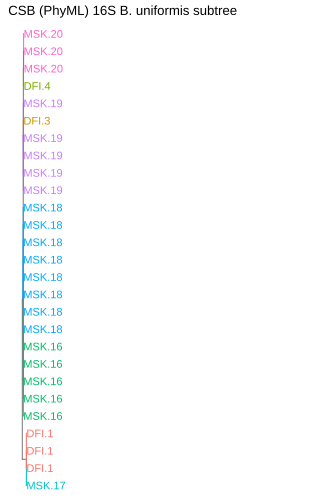

In [57]:
R"""
# plot M. gnavus subtree
colorvalues = RColorBrewer::brewer.pal(12, name="Set3")
p = ggtree(tree_subset(tree_withdata, "MSK.19.84", levels_back = 3), 
        aes(color=Donor), 
        layout="rect", open.angle=10,
    ) + 
    ggtitle("CSB (PhyML) 16S B. uniformis subtree") + 
    theme(
        legend.position = "none", 
    ) +
    xlim(0, 4) +
    geom_tiplab(aes(label=Donor))
ggsave(file.path($pdir_16S, "CSB669_PhyML_buniformis_16S.svg"),
    p, 
    height=7,
    width=4.5,
)
""";
show_svg(joinpath(pdir_16S, "CSB669_PhyML_buniformis_16S.svg"))

## Phyml on Bac120 alignment of Biobank strains

In [ ]:
# run(`sbatch $(projectdir("scripts", "run_phyml_csbbac120.jl"))`);

Triggers run of `scripts/run_phyml_csbbac120.jl` script on SLURM compute cluster. Has the effect of running

```
phyml -daa -mLG -fe -o tlr \
    --search SPR --r_seed 123456 --rand_start --n_rand_starts 3 \
    --no_memory_check \
    --bootstrap -4 \
    -i $PROJECTDIR/data/exp_raw/BB669/BB669_bac120.phy
```

outputting the results in `_research/BB669_bac120_phyml` 

### plot PhyML tree of Bac120 alignment

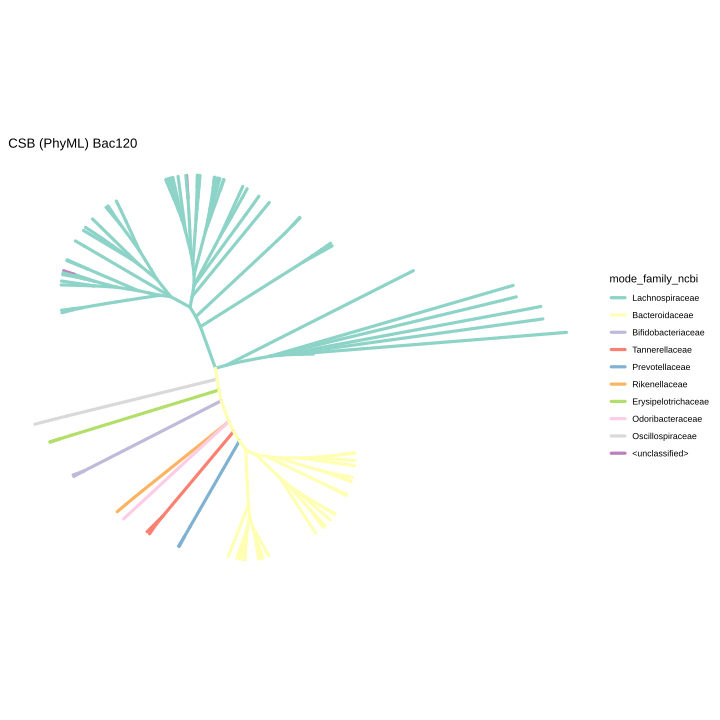

In [58]:
R"""
## read in tree and metadata
tree = read.newick(file.path($tdir_bac120, "BB669_bac120.phy-supporttree_multi.txt"), node.label='support')
lineagedf = read.csv(file.path($bbdir, "BB669_rowmeta.tsv"), sep="\t")
lineagedf$label = lineagedf$Strain.ID
subset_lineagedf = lineagedf[match(tree@phylo$tip.label, lineagedf$label),]
biggerfamily_ncbi = sort(table(subset_lineagedf$NCBI.Family), decreasing = TRUE)[sort(table(subset_lineagedf$NCBI.Family), decreasing = TRUE) > 0]
# labels(biggerfamily_ncbi)[[1]]
tree_withdata = as.treedata(left_join(as_tibble(tree), subset_lineagedf, by='label'))
btree_tbl = as_tibble(tree_withdata)

## Calcuate most common family desendent from each internal node of the tree
mode_family_ncbi = offspring(btree_tbl, btree_tbl$node, tiponly = FALSE, self_include = TRUE)
mode_family_ncbi = unlist(lapply(mode_family_ncbi, function(x) modeest::mfv1(x$NCBI.Family, na_rm=TRUE)))
btree_tbl$mode_family_ncbi = mode_family_ncbi
tree_withdata = as.treedata(btree_tbl)

## plot tree colored with most common family at each node
options(repr.plot.width=15, repr.plot.height=15, ignore.negative.edge=TRUE)
colorvalues = RColorBrewer::brewer.pal(12, name="Set3")
p = ggtree(tree_withdata, 
        aes(color=mode_family_ncbi, subset=support > .5), 
        layout="equal_angle", open.angle=5,
        branch.length="none", size=1.5,
    ) +
    ggtitle("CSB (PhyML) Bac120") + 
    scale_color_manual(values=colorvalues, breaks=labels(biggerfamily_ncbi)[[1]]) #+theme(legend.position="none")
ggsave(file.path($pdir_bac120, "CSB669_PhyML_unrooted_bac120.svg"), 
    p,
    height=10,
    width=10,
)
"""
show_svg(joinpath(pdir_bac120, "CSB669_PhyML_unrooted_bac120.svg"))

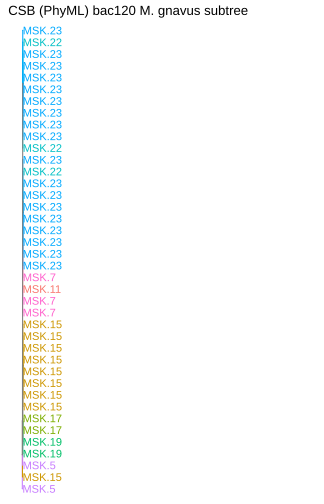

In [59]:
R"""
# plot M. gnavus subtree
colorvalues = RColorBrewer::brewer.pal(12, name="Set3")
p = ggtree(tree_subset(tree_withdata, "MSK.5.17", levels_back = 1), 
        aes(color=Donor), 
        layout="rect", open.angle=10,
    ) + 
    ggtitle("CSB (PhyML) bac120 M. gnavus subtree") + 
    theme(
        legend.position = "none", 
    ) +
    xlim(0, 4) +
    geom_tiplab(aes(label=Donor))
ggsave(file.path($pdir_16S, "CSB669_PhyML_rgnavus_bac120.svg"),
    p, 
    height=7,
    width=4.5,
)
""";
show_svg(joinpath(pdir_16S, "CSB669_PhyML_rgnavus_bac120.svg"))

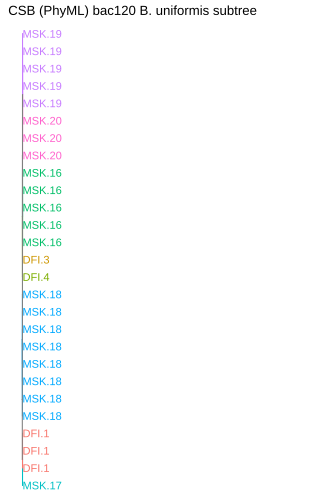

In [60]:
R"""
# plot M. gnavus subtree
colorvalues = RColorBrewer::brewer.pal(12, name="Set3")
p = ggtree(tree_subset(tree_withdata, "MSK.19.84", levels_back = 5), 
        aes(color=Donor), 
        layout="rect", open.angle=10,
    ) + 
    ggtitle("CSB (PhyML) bac120 B. uniformis subtree") + 
    theme(
        legend.position = "none", 
    ) +
    xlim(0, 4) +
    geom_tiplab(aes(label=Donor))
ggsave(file.path($pdir_16S, "CSB669_PhyML_buniformis_bac120.svg"),
    p, 
    height=7,
    width=4.5,
)
""";
show_svg(joinpath(pdir_16S, "CSB669_PhyML_buniformis_bac120.svg"))

## Metabolite variablilty 

In [55]:
theme(:default, grid=false, tickdir=:out, label=false)
pdir_met = plotsdir("metabolite_strainvariation") |> mkpath

"/Users/bend/projects/Doran_etal_2023/plots/metabolite_strainvariation"

In [16]:
# load metabolites matrix
metmtx = biobank["metabolites_foldchange"].X[:, :][biobank.obs.kept_species,:];

# too close to zero for detectable measurment, so assume no change
metmtx[isinf.(metmtx)] .= 0.0; 
@show size(metmtx)

# filter to metabolites that have at least 10% detectable shifts in measurement
metabolite_names_full = biobank["metabolites_foldchange"].var_names.vals;
keepmetabolites_mask = mapslices(c->mean(c .== 0.0) < 0.9, metmtx, dims=1) |> vec;
metabolite_names = metabolite_names_full[keepmetabolites_mask]
metmtx = metmtx[:, keepmetabolites_mask];
@show size(metmtx);

size(metmtx) = (356, 50)
size(metmtx) = 

(356, 32)


In [18]:
speciescolors = CSV.read(datadir("exp_raw", "BB669", "subsettreecolors.csv"), DataFrame);
metabolitelabels = biobank["metabolites_foldchange"].var.label;

In [19]:
metbbobs = bbobs[biobank.obs.kept_species, :];

In [20]:
metabolite_species = sort(countmap(metbbobs.Species), byvalue=true, rev=true)

OrderedCollections.OrderedDict{String, Int64} with 11 entries:
  "Phocaeicola vulgatus"         => 88
  "[Ruminococcus] gnavus"        => 41
  "Bacteroides thetaiotaomicron" => 35
  "Anaerostipes hadrus"          => 31
  "Bacteroides uniformis"        => 27
  "Blautia luti"                 => 24
  "Bifidobacterium breve"        => 24
  "Coprococcus comes"            => 23
  "Dorea formicigenerans"        => 22
  "Blautia wexlerae"             => 21
  "[Eubacterium] rectale"        => 20

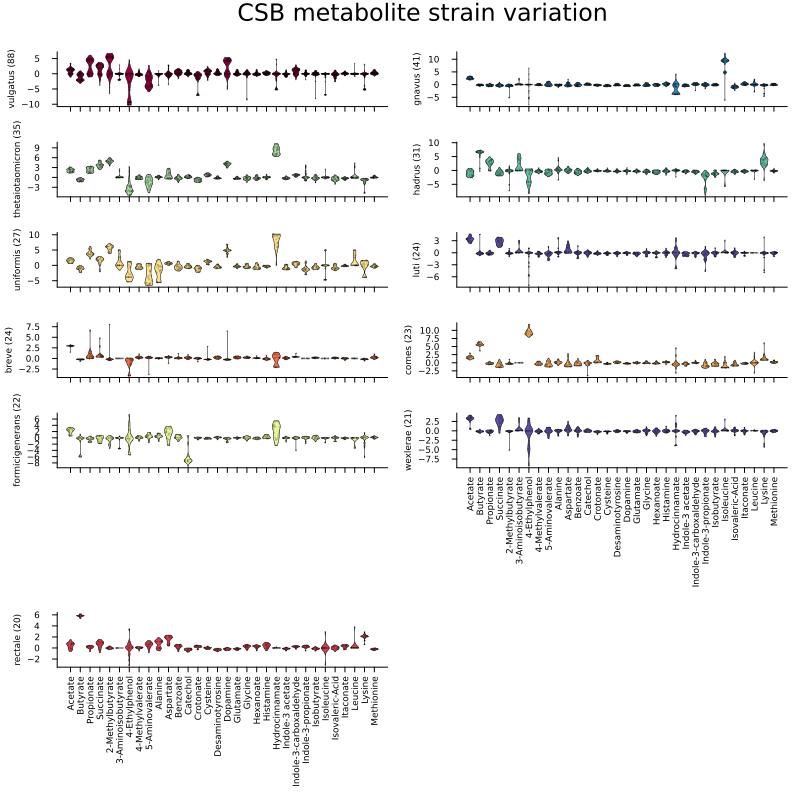

In [57]:
#| code-fold: true
#| code-summary: show plotting code
#| fig-cap: show log-2 fold change from base media across strains from 9 species with more than 20 replicates. multi-modal distributions for some distributions indicates sub-species variation in phenotype.

ps = []
for (i, species) in enumerate(keys(metabolite_species))
    speciesmask = occursin.(species, metbbobs.Species)
    p = violin(permutedims(1:size(metmtx, 2)),
        metmtx[speciesmask, :],
        ylabel="$(last(split(species," "))) ($(metabolite_species[species]))",
        c=speciescolors.color[findfirst(==(species), speciescolors.species_name)],
        xticks= i>=10 ? (1:size(metmtx, 2), metabolitelabels) : (1:size(metmtx, 2), repeat([""], size(metmtx, 2))),
        xrotation=90,
    )
    dotplot!(permutedims(1:size(metmtx, 2)),
        metmtx[speciesmask, :], 
        c=:black, alpha=.2, markerstrokewidth=0, markersize=1,
        # side=:right
    )
    push!(ps, p)
end

plot(ps..., 
    layout=grid(ceil(Int, length(metabolite_species)/2), 2), 
    plot_title = "CSB metabolite strain variation",
    size=(800, 800),
    tickdirection=:out,
    labelfontsize=6,
    tickfontsize=6,
    lw=.5,
    markersize=1
)

In [23]:
savefig(joinpath(pdir_met, "violinplots_32metabolites_strainlevel_variation.pdf"))

"/Users/bend/projects/Doran_etal_2023/plots/metabolite_strainvariation/violinplots_32metabolites_strainlevel_variation.pdf"

## Proforming PCA analysis

In [58]:
theme(:default, grid=false, framestyle=:box, label="", ratio=1)

### Full CSB

In [168]:
csb_mtx = biobank["oggs"].X[:,:]

# find variable OGGs
ogg_mask = vec(var(csb_mtx, dims=1) .> 0)
# mean center variable OGGs
meancentered_csbmtx = mapslices(x->x.-mean(x), csb_mtx[:, ogg_mask], dims=1)
# svd of mean centered matrix
bbusv_csb = svd(meancentered_csbmtx);

@show size(meancentered_csbmtx);

size(meancentered_csbmtx) = (669, 8359)


In [169]:
# Principal Components from SVD
pcs_csb = bbusv_csb.U * Diagonal(bbusv_csb.S);
# percent of variance explained by each PC
pctvar = (bbusv_csb.S .^ 2 / sum(bbusv_csb.S .^ 2)) * 100;

In [170]:
#| code-fold: true
#| code-summary: map colors to NCBI families in correct order for plotting
familyid = bbobs.NCBI_Family
orderedfamilylabels = stack(DataFrame(countmap(familyid)), 1:12) |>
    df -> DataFrames.transform(df, :value => (-) => :minusvalue) |>
    df -> sort(df, [:minusvalue, :variable], rev=false) |>
    df -> df.variable
familycolors = permutedims(palette(:Set3_12).colors.colors[indexin(sort(unique(familyid)), orderedfamilylabels)]);

# collect Butyrate and Succinate values for colormap
butyrate_foldchange_per_strain = biobank["metabolites_foldchange"].X[:, findfirst(==("Butyrate"), biobank["metabolites_foldchange"].var.label)];
succinate_foldchange_per_strain = biobank["metabolites_foldchange"].X[:, findfirst(==("Succinate"), biobank["metabolites_foldchange"].var.label)];

# get color limits based on most extreme value
butyrate_lims = getlims(butyrate_foldchange_per_strain)
succinate_lims = getlims(succinate_foldchange_per_strain);

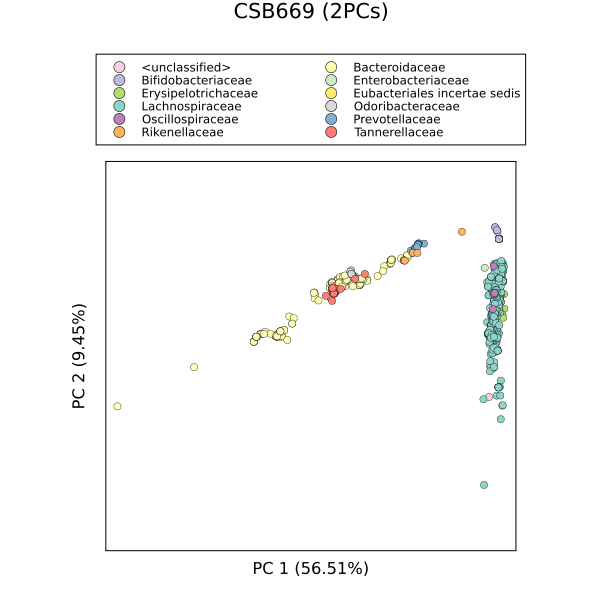

In [171]:
scatter(pcs_csb[:, 1], pcs_csb[:, 2],
    group=familyid,
    alpha=1, markerstrokewidth=.3,
    size=(600,600),
    legend=:outertop,
    legendcolumns=2,
    c=familycolors,
    margin=5Plots.mm,
    ticks=:none,
    title="CSB669 (2PCs)",
    xlabel="PC 1 ($(round(pctvar[1], digits=2))%)",
    ylabel="PC 2 ($(round(pctvar[2], digits=2))%)",
)

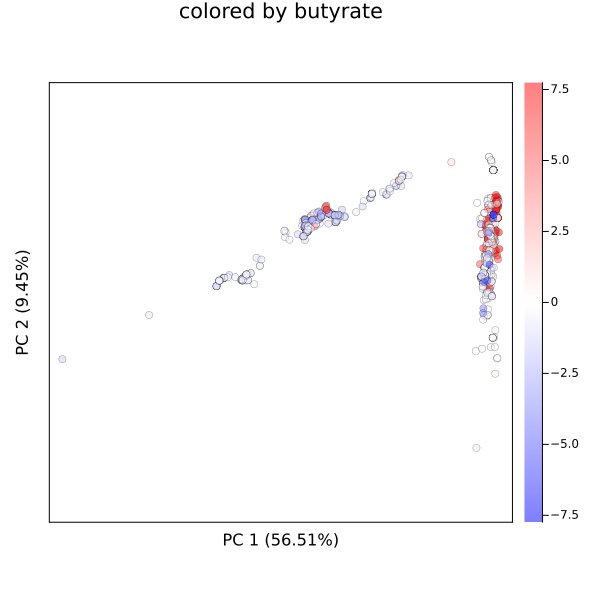

In [172]:
scatter(pcs_csb[:, 1], pcs_csb[:, 2],
    marker_z=butyrate_foldchange_per_strain,
    c=:bwr, clims=butyrate_lims,
    alpha=.5, markerstrokewidth=.3, ticks=false,
    size=(600,600), margin=5Plots.mm,
    title="colored by butyrate",
    xlabel="PC 1 ($(round(pctvar[1], digits=2))%)",
    ylabel="PC 2 ($(round(pctvar[2], digits=2))%)",
)

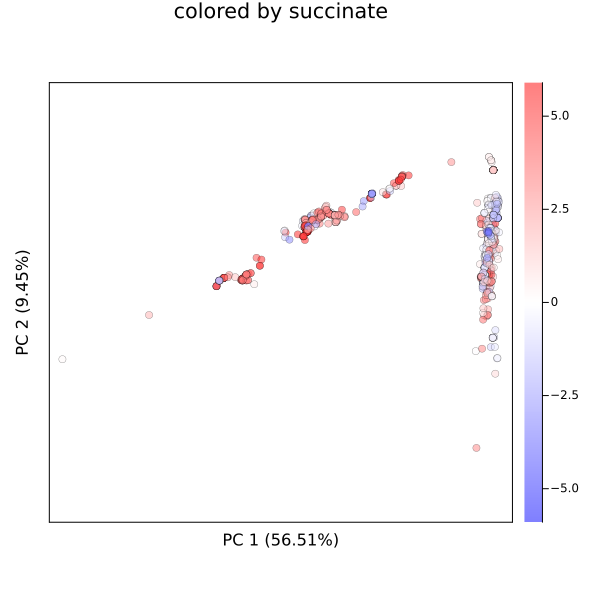

In [173]:
scatter(pcs_csb[:, 1], pcs_csb[:, 2],
    marker_z=succinate_foldchange_per_strain,
    c=:bwr, clims=succinate_lims,
    alpha=.5, markerstrokewidth=.3, ticks=false,
    size=(600,600), margin=5Plots.mm,
    title="colored by succinate",
    xlabel="PC 1 ($(round(pctvar[1], digits=2))%)",
    ylabel="PC 2 ($(round(pctvar[2], digits=2))%)",
)

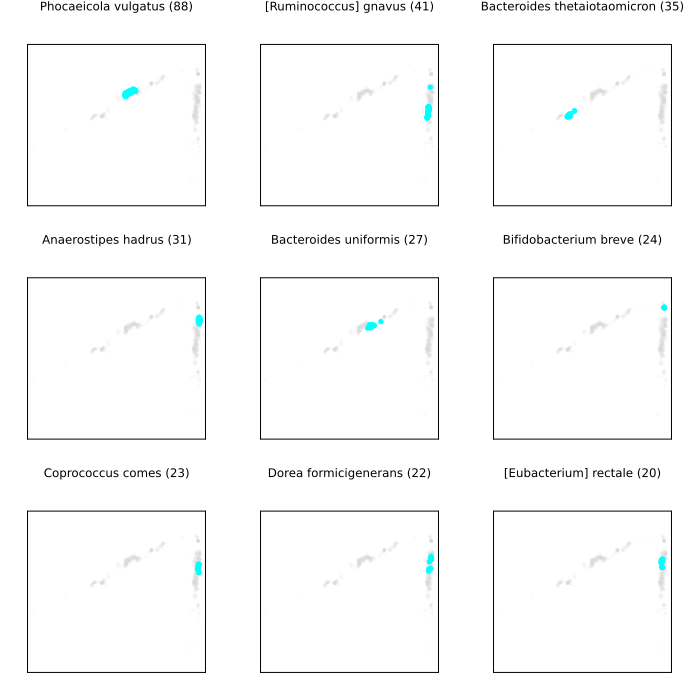

In [174]:
#| fig-cap: Each sub-plot shows 669 CSB strains on PC 1 (x axis) and PC 2 (y axis). Aqua dots correspond to strains belonging to the species listed in each sub-title followed by the number of strains belonging to that species. Remaining strains are shown in grey.
#| code-fold: true
#| code-summary: show plotting code
species_labelscounts = map(speciescolors.species_name[Not(5,6)]) do label
    cnt = occursin.(biobank.obs.Species, label) |> sum
    label, cnt
end |> x->sort(x, by=last, rev=true)

ps = []
for (label, cnt) in species_labelscounts
    mask = occursin.(biobank.obs.Species, label)
    p = plot()
    scatter!(pcs_csb[.!mask, 1], pcs_csb[.!mask, 2]; c=:lightgrey, alpha=.1, markersize=2, markerstrokewidth=0)
    scatter!(pcs_csb[mask, 1], pcs_csb[mask, 2];
        title="$label ($cnt)", 
        c=:aqua,
        alpha=1, 
        markersize=3, 
        markerstrokewidth=0, 
    )
    push!(ps, p)
end
plot(ps...;
    layout=grid(3,3),
    size=(700,700),
    supertitle="CSB669 10PCs",
    # xlabel="PC 1",
    # ylabel="PC 2",
    titlefontsize=8,
    labelfontsize=6,
    ticks=false,
    margin=5Plots.mm,

)

### Subset to Bacteroidacae

In [175]:
mask = biobank.obs.NCBI_Family .== "Bacteroidaceae";

In [176]:
csb_mtx = biobank["oggs"].X[:,:][mask, :]

# find variable OGGs
ogg_mask = vec(var(csb_mtx, dims=1) .> 0)
# mean center variable OGGs
meancentered_csbmtx = mapslices(x->x.-mean(x), csb_mtx[:, ogg_mask], dims=1)
# svd of mean centered matrix
bbusv_csb = svd(meancentered_csbmtx);

@show size(meancentered_csbmtx);

size(meancentered_csbmtx) = (229, 3755)


In [177]:
# Principal Components from SVD
pcs_csb = bbusv_csb.U * Diagonal(bbusv_csb.S);
# percent of variance explained by each PC
pctvar = (bbusv_csb.S .^ 2 / sum(bbusv_csb.S .^ 2)) * 100;

In [178]:
#| code-fold: true
#| code-summary: map colors to NCBI Species in correct order for plotting
genusid = biobank.obs.NCBI_Genus[mask]

# collect Butyrate and Succinate values for colormap
butyrate_foldchange_per_strain = biobank["metabolites_foldchange"].X[:, findfirst(==("Butyrate"), biobank["metabolites_foldchange"].var.label)][mask, :];
succinate_foldchange_per_strain = biobank["metabolites_foldchange"].X[:, findfirst(==("Succinate"), biobank["metabolites_foldchange"].var.label)][mask, :];

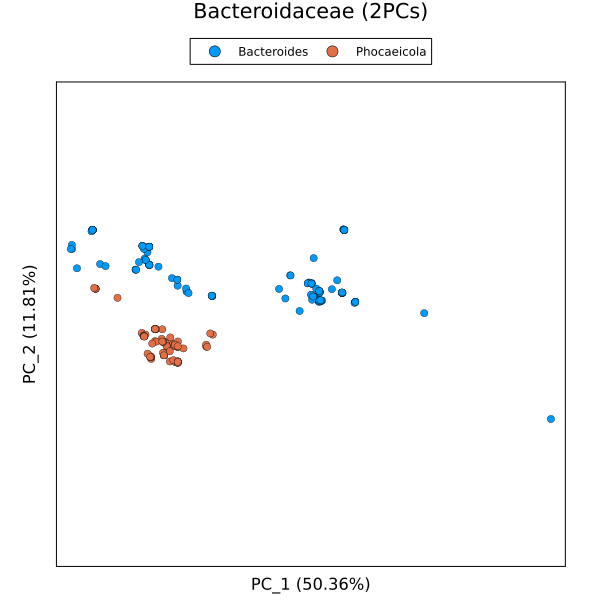

In [179]:
scatter(pcs_csb[:, 1], pcs_csb[:, 2],
    group=genusid,
    alpha=1, markerstrokewidth=.3,
    size=(600,600),
    legend=:outertop,
    legendcolumns=2,
    ticks=:none,
    title="Bacteroidaceae (2PCs)",
    xlabel="PC_1 ($(round(pctvar[1], digits=2))%)",
    ylabel="PC_2 ($(round(pctvar[2], digits=2))%)",
)

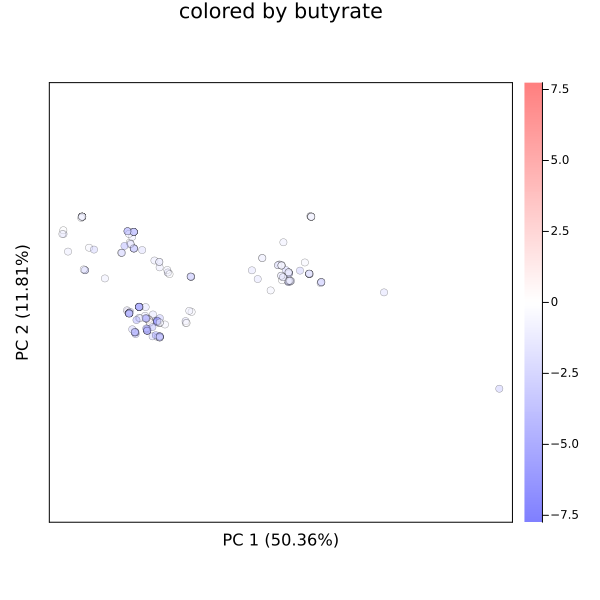

In [180]:
scatter(pcs_csb[:, 1], pcs_csb[:, 2],
    marker_z=butyrate_foldchange_per_strain,
    c=:bwr, clims=butyrate_lims,
    alpha=.5, markerstrokewidth=.3, ticks=false,
    size=(600,600), margin=5Plots.mm,
    title="colored by butyrate",
    xlabel="PC 1 ($(round(pctvar[1], digits=2))%)",
    ylabel="PC 2 ($(round(pctvar[2], digits=2))%)",
)

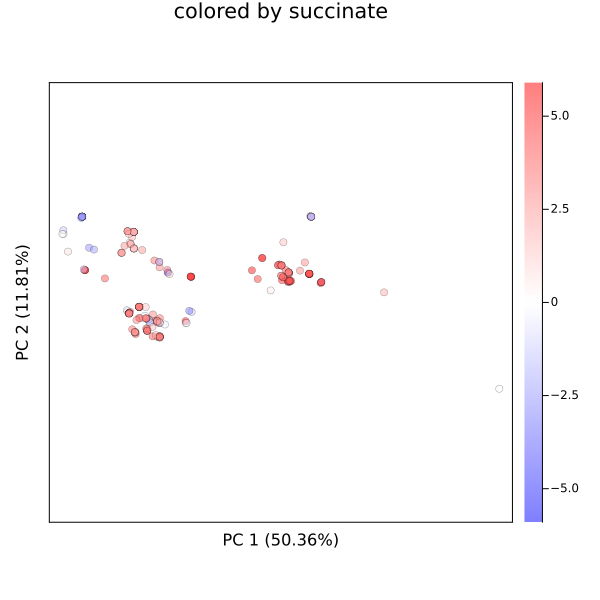

In [181]:
scatter(pcs_csb[:, 1], pcs_csb[:, 2],
    marker_z=succinate_foldchange_per_strain,
    c=:bwr, clims=succinate_lims,
    alpha=.5, markerstrokewidth=.3, ticks=false,
    size=(600,600), margin=5Plots.mm,
    title="colored by succinate",
    xlabel="PC 1 ($(round(pctvar[1], digits=2))%)",
    ylabel="PC 2 ($(round(pctvar[2], digits=2))%)",
)

### Subset to Phocaeicoli

In [182]:
mask = biobank.obs.NCBI_Genus .== "Phocaeicola";

In [183]:
csb_mtx = biobank["oggs"].X[:,:][mask, :]

# find variable OGGs
ogg_mask = vec(var(csb_mtx, dims=1) .> 0)
# mean center variable OGGs
meancentered_csbmtx = mapslices(x->x.-mean(x), csb_mtx[:, ogg_mask], dims=1)
# svd of mean centered matrix
bbusv_csb = svd(meancentered_csbmtx);

@show size(meancentered_csbmtx);

size(meancentered_csbmtx) = (103, 2065)


In [184]:
# Principal Components from SVD
pcs_csb = bbusv_csb.U * Diagonal(bbusv_csb.S);
# percent of variance explained by each PC
pctvar = (bbusv_csb.S .^ 2 / sum(bbusv_csb.S .^ 2)) * 100;

In [185]:
#| code-fold: true
#| code-summary: map colors to NCBI Species in correct order for plotting
speciesid = biobank.obs.NCBI_Species[mask]

# collect Butyrate and Succinate values for colormap
butyrate_foldchange_per_strain = biobank["metabolites_foldchange"].X[:, findfirst(==("Butyrate"), biobank["metabolites_foldchange"].var.label)][mask, :];
succinate_foldchange_per_strain = biobank["metabolites_foldchange"].X[:, findfirst(==("Succinate"), biobank["metabolites_foldchange"].var.label)][mask, :];

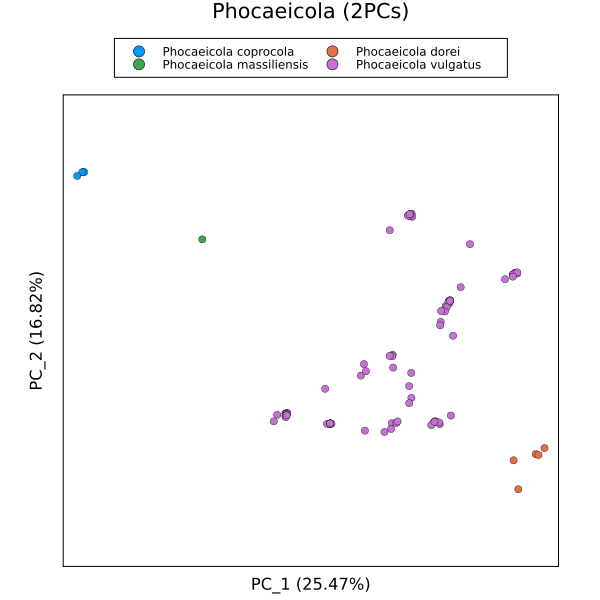

In [186]:
scatter(pcs_csb[:, 1], pcs_csb[:, 2],
    group=speciesid,
    alpha=1, markerstrokewidth=.3,
    size=(600,600),
    legend=:outertop,
    legendcolumns=2,
    ticks=:none,
    title="Phocaeicola (2PCs)",
    xlabel="PC_1 ($(round(pctvar[1], digits=2))%)",
    ylabel="PC_2 ($(round(pctvar[2], digits=2))%)",
)

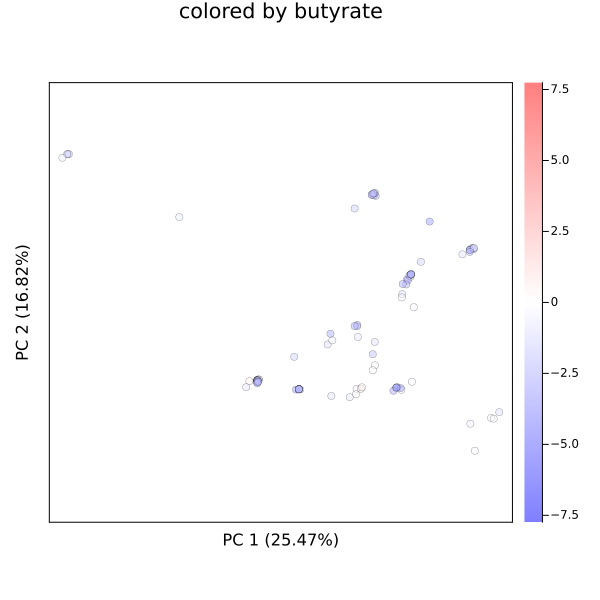

In [187]:
scatter(pcs_csb[:, 1], pcs_csb[:, 2],
    marker_z=butyrate_foldchange_per_strain,
    c=:bwr, clims=butyrate_lims,
    alpha=.5, markerstrokewidth=.3, ticks=false,
    size=(600,600), margin=5Plots.mm,
    title="colored by butyrate",
    xlabel="PC 1 ($(round(pctvar[1], digits=2))%)",
    ylabel="PC 2 ($(round(pctvar[2], digits=2))%)",
)

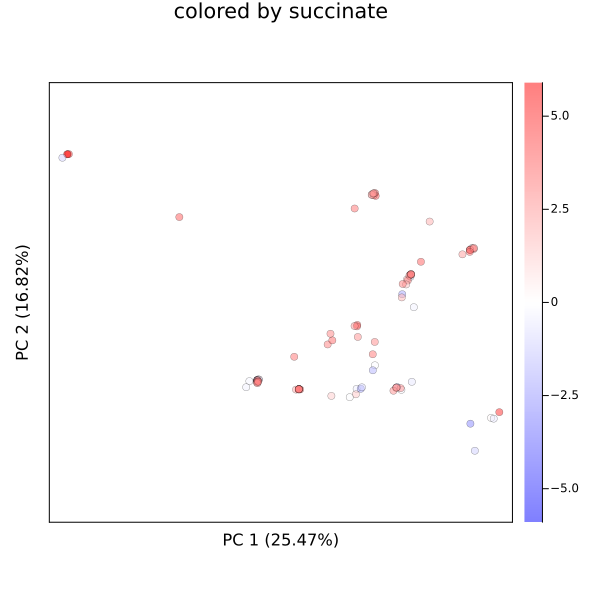

In [188]:
scatter(pcs_csb[:, 1], pcs_csb[:, 2],
    marker_z=succinate_foldchange_per_strain,
    c=:bwr, clims=succinate_lims,
    alpha=.5, markerstrokewidth=.3, ticks=false,
    size=(600,600), margin=5Plots.mm,
    title="colored by succinate",
    xlabel="PC 1 ($(round(pctvar[1], digits=2))%)",
    ylabel="PC 2 ($(round(pctvar[2], digits=2))%)",
)

### Subset to P. vulgatus

In [189]:
mask = biobank.obs.NCBI_Species .== "Phocaeicola vulgatus";

In [190]:
csb_mtx = biobank["oggs"].X[:,:][mask, :]

# find variable OGGs
ogg_mask = vec(var(csb_mtx, dims=1) .> 0)
# mean center variable OGGs
meancentered_csbmtx = mapslices(x->x.-mean(x), csb_mtx[:, ogg_mask], dims=1)
# svd of mean centered matrix
bbusv_csb = svd(meancentered_csbmtx);

@show size(meancentered_csbmtx);

size(meancentered_csbmtx) = (93, 1551)


In [191]:
# Principal Components from SVD
pcs_csb = bbusv_csb.U * Diagonal(bbusv_csb.S);
# percent of variance explained by each PC
pctvar = (bbusv_csb.S .^ 2 / sum(bbusv_csb.S .^ 2)) * 100;

In [192]:
#| code-fold: true
#| code-summary: map colors to NCBI Species in correct order for plotting
speciesid = biobank.obs.NCBI_Species[mask]

# collect Butyrate and Succinate values for colormap
butyrate_foldchange_per_strain = biobank["metabolites_foldchange"].X[:, findfirst(==("Butyrate"), biobank["metabolites_foldchange"].var.label)][mask, :];
succinate_foldchange_per_strain = biobank["metabolites_foldchange"].X[:, findfirst(==("Succinate"), biobank["metabolites_foldchange"].var.label)][mask, :];

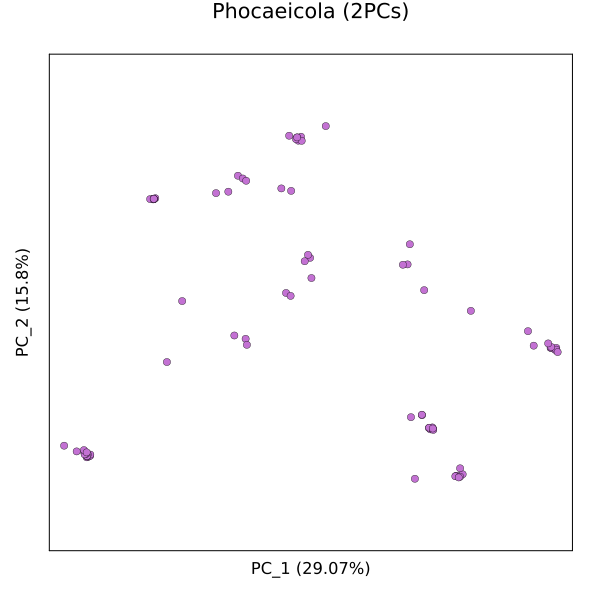

In [193]:
scatter(pcs_csb[:, 1], pcs_csb[:, 2],  c=4,
    alpha=1, markerstrokewidth=.3,
    size=(600,600),
    ticks=:none,
    title="Phocaeicola (2PCs)",
    margin=5Plots.mm,
    xlabel="PC_1 ($(round(pctvar[1], digits=2))%)",
    ylabel="PC_2 ($(round(pctvar[2], digits=2))%)",
)

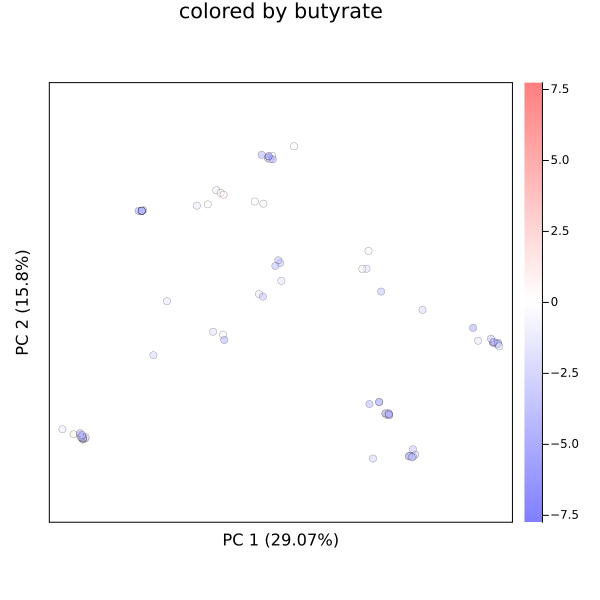

In [194]:
scatter(pcs_csb[:, 1], pcs_csb[:, 2],
    marker_z=butyrate_foldchange_per_strain,
    c=:bwr, clims=butyrate_lims,
    alpha=.5, markerstrokewidth=.3, ticks=false,
    size=(600,600), margin=5Plots.mm,
    title="colored by butyrate",
    xlabel="PC 1 ($(round(pctvar[1], digits=2))%)",
    ylabel="PC 2 ($(round(pctvar[2], digits=2))%)",
)

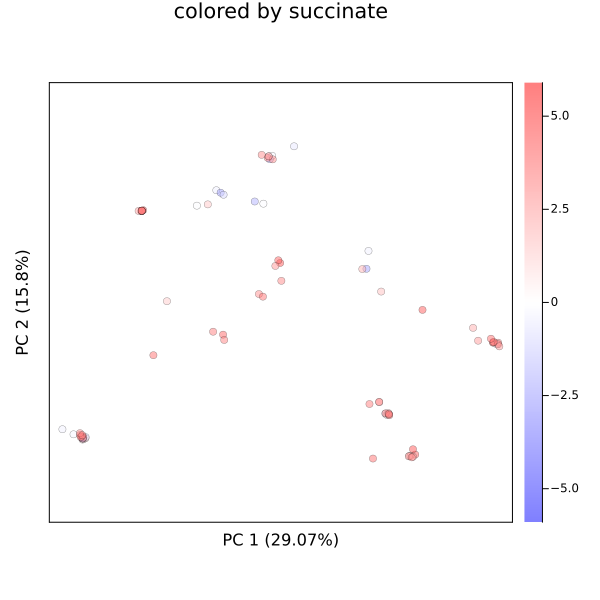

In [195]:
scatter(pcs_csb[:, 1], pcs_csb[:, 2],
    marker_z=succinate_foldchange_per_strain,
    c=:bwr, clims=succinate_lims,
    alpha=.5, markerstrokewidth=.3, ticks=false,
    size=(600,600), margin=5Plots.mm,
    title="colored by succinate",
    xlabel="PC 1 ($(round(pctvar[1], digits=2))%)",
    ylabel="PC 2 ($(round(pctvar[2], digits=2))%)",
)

## Umap analysis of biobank strains

In [205]:
#| code-fold: true
#| code-summary: Calcuate PCs on full CSB
theme(:default, grid=false, framestyle=:box, label="", ratio=1)
csb_mtx = biobank["oggs"].X[:,:]

# find variable OGGs
ogg_mask = vec(var(csb_mtx, dims=1) .> 0)
# mean center variable OGGs
meancentered_csbmtx = mapslices(x->x.-mean(x), csb_mtx[:, ogg_mask], dims=1)
# svd of mean centered matrix
bbusv_csb = svd(meancentered_csbmtx);

@show size(meancentered_csbmtx);

# Principal Components from SVD
pcs_csb = bbusv_csb.U * Diagonal(bbusv_csb.S);
# percent of variance explained by each PC
pctvar = (bbusv_csb.S .^ 2 / sum(bbusv_csb.S .^ 2)) * 100;

familyid = bbobs.NCBI_Family
orderedfamilylabels = stack(DataFrame(countmap(familyid)), 1:12) |>
    df -> DataFrames.transform(df, :value => (-) => :minusvalue) |>
    df -> sort(df, [:minusvalue, :variable], rev=false) |>
    df -> df.variable
familycolors = permutedims(palette(:Set3_12).colors.colors[indexin(sort(unique(familyid)), orderedfamilylabels)]);

size(meancentered_csbmtx) = (669, 8359)


In [249]:
seed!(424242)
pcs_csb = bbusv_csb.U * Diagonal(bbusv_csb.S)
n_neighbors = floor(Int,3*sqrt(669))
pcs_umap_coords = umap(pcs_csb[:, 1:10]', 2; n_neighbors, metric=Euclidean())';
@show n_neighbors;

n_neighbors = 77


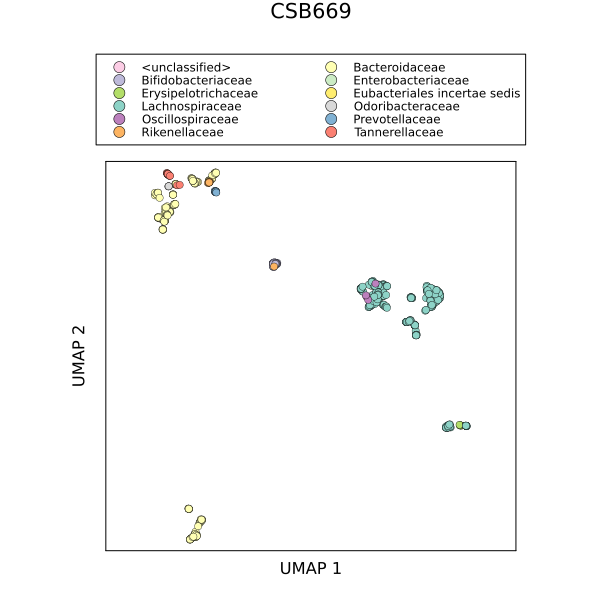

In [246]:
scatter(pcs_umap_coords[:, 1], pcs_umap_coords[:, 2],
    group=familyid,
    alpha=1, markerstrokewidth=.3,
    size=(600,600),
    legend=:outertop,
    legendcolumns=2,
    c=familycolors,
    margin=5Plots.mm,
    ticks=:none,
    title="CSB669",
    xlabel="UMAP 1",
    ylabel="UMAP 2",
)

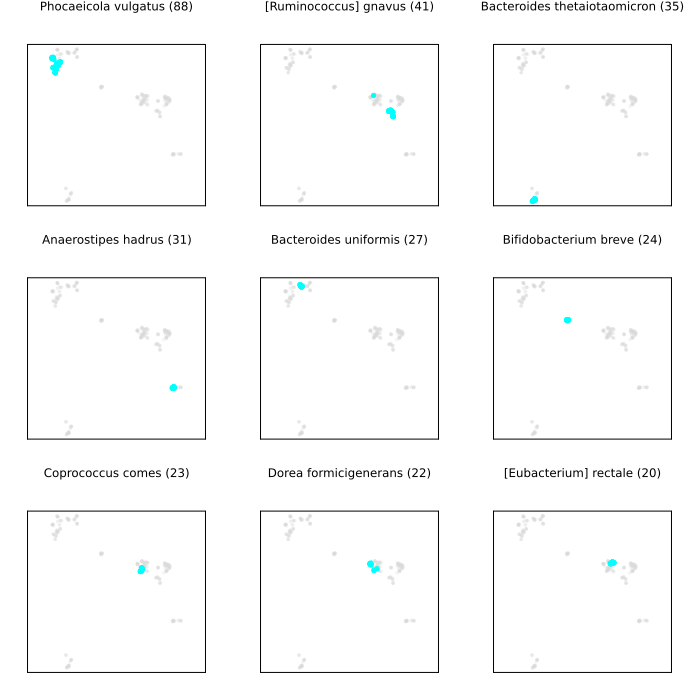

In [248]:
#| fig-cap: Each sub-plot shows 669 CSB strains on UMAP 1 (x axis) and UMAP 2 (y axis) generated from euclidean distance across the leading 10 PCs and 77 shared nearest neighbors. Aqua dots correspond to strains belonging to the species listed in each sub-title followed by the number of strains belonging to that species. Remaining strains are shown in grey.
#| code-fold: true
#| code-summary: show plotting code
species_labelscounts = map(speciescolors.species_name[Not(5,6)]) do label
    cnt = occursin.(biobank.obs.Species, label) |> sum
    label, cnt
end |> x->sort(x, by=last, rev=true)

ps = []
for (label, cnt) in species_labelscounts
    mask = occursin.(biobank.obs.Species, label)
    p = plot()
    scatter!(pcs_umap_coords[.!mask, 1], pcs_umap_coords[.!mask, 2]; c=:lightgrey, alpha=.1, markersize=2, markerstrokewidth=0)
    scatter!(pcs_umap_coords[mask, 1], pcs_umap_coords[mask, 2];
        title="$label ($cnt)", 
        c=:aqua,
        alpha=1, 
        markersize=3, 
        markerstrokewidth=0, 
    )
    push!(ps, p)
end
plot(ps...;
    layout=grid(3,3),
    size=(700,700),
    supertitle="CSB669 10PCs",
    # xlabel="PC 1",
    # ylabel="PC 2",
    titlefontsize=8,
    labelfontsize=6,
    ticks=false,
    margin=5Plots.mm,

)